In [1]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.signal import find_peaks, savgol_filter
import re
import csv
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns
import itertools
from sklearn.model_selection import cross_val_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [2]:
def read_csv_data(main_folder_path):
    data = {}

    # Recorre todas las subcarpetas en el directorio principal especificado
    for subfolder_name in os.listdir(main_folder_path):
        subfolder_path = os.path.join(main_folder_path, subfolder_name)
        
        # Verifica que sea un directorio
        if os.path.isdir(subfolder_path):
            # Inicializa una lista para almacenar los DataFrames de esta subcarpeta
            data[subfolder_name] = []
            
            # Recorre todos los archivos en la subcarpeta
            for filename in os.listdir(subfolder_path):
                # Solo procesa archivos con extensión .csv
                if filename.endswith(".csv"):
                    # Construye la ruta completa del archivo
                    file_path = os.path.join(subfolder_path, filename)
                    
                    # Lee el archivo CSV, omitiendo la primera fila, sin encabezados, y separa los datos por comas
                    df = pd.read_csv(file_path, header=None, names=['I', 'Q'], skiprows=1)
                    
                    # Añade una tupla (nombre del archivo, DataFrame) a la lista correspondiente a la subcarpeta
                    data[subfolder_name].append((filename, df))
    
    return data

# Especifica la ruta a tu carpeta principal
main_folder_path = "contenedor"

# Llama a la función y almacena los datos en un diccionario
data = read_csv_data(main_folder_path)

# Opcional: imprimir la cantidad de archivos leídos por subcarpeta
for subfolder_name, files in data.items():
    print(f"Subcarpeta '{subfolder_name}': se han leído {len(files)} archivos CSV.")

# Opcional: imprimir las primeras filas de cada DataFrame junto con su subcarpeta y nombre del archivo
for subfolder_name, files in data.items():
    for filename, df in files:
        print(f"Subcarpeta: {subfolder_name}, Archivo: {filename}:\n", df.head().to_string(index=False))

Subcarpeta '.ipynb_checkpoints': se han leído 0 archivos CSV.
Subcarpeta '15.5GHz_spacing': se han leído 9 archivos CSV.
Subcarpeta '15GHz_spacing': se han leído 7 archivos CSV.
Subcarpeta '16.5GHz_spacing': se han leído 11 archivos CSV.
Subcarpeta '16GHz_spacing': se han leído 11 archivos CSV.
Subcarpeta '17.6GHz_spacing': se han leído 11 archivos CSV.
Subcarpeta '17GHz_spacing': se han leído 11 archivos CSV.
Subcarpeta '18GHz_spacing': se han leído 10 archivos CSV.
Subcarpeta '50GHz_spacing': se han leído 11 archivos CSV.
Subcarpeta: 15.5GHz_spacing, Archivo: 16QAM_3x16GBd_consY20dB.csv:
         I         Q
 1.639193 -2.864446
 2.031449  0.380656
-0.096213  3.110882
-0.882746 -2.339520
 1.803395  1.087012
Subcarpeta: 15.5GHz_spacing, Archivo: 16QAM_3x16GBd_consY21.5dB.csv:
         I         Q
 2.223405 -2.569107
-2.955521  2.290002
 1.566678 -2.457914
-1.961902 -1.687558
-1.869490 -2.404541
Subcarpeta: 15.5GHz_spacing, Archivo: 16QAM_3x16GBd_consY23dB.csv:
         I         Q
-3.8

In [3]:
def list_subfolders(data):
    print("Subcarpetas disponibles:")
    for subfolder_name in data.keys():
        print(subfolder_name)
        
#Encontrar picos        
def find_peak_in_segment(counts, bin_edges, start, end):
    # Encontrar los índices de los bins que corresponden al segmento
    start_idx = np.searchsorted(bin_edges, start, side='right')
    end_idx = np.searchsorted(bin_edges, end, side='left')

    # Encontrar el pico más alto en el segmento
    peak_idx = start_idx + np.argmax(counts[start_idx:end_idx])

    return peak_idx

#Encontrar valles
# prueba valles
def find_valley_in_segment(counts, bin_edges, start, end):
    # Encontrar los índices de los bins que corresponden al segmento
    start_idx = np.searchsorted(bin_edges, start, side='right')
    end_idx = np.searchsorted(bin_edges, end, side='left')

    # Encontrar el valle más bajo en el segmento
    valley_idx = start_idx + np.argmin(counts[start_idx:end_idx])

    return valley_idx

In [4]:
def plot_histograms_for_subfolder_all(data, subfolder_name, var_name):
    results_all = {}  # Inicializar siempre el diccionario de resultados
    if subfolder_name not in data:
        print(f"La subcarpeta '{subfolder_name}' no existe en los datos.")
        return results_all  # Retornar diccionario vacío si la subcarpeta no existe

    files = data[subfolder_name]
    
    # Generar un histograma para cada archivo en la subcarpeta seleccionada
    for filename, df in files:
        # Obtén los datos del histograma
        counts, bin_edges = np.histogram(df[var_name], bins=100)
        
        # Encontrar el pico más alto en cada segmento
        peaks = [
            find_peak_in_segment(counts, bin_edges, -4, -2),
            find_peak_in_segment(counts, bin_edges, -2, 0),
            find_peak_in_segment(counts, bin_edges, 0, 2),
            find_peak_in_segment(counts, bin_edges, 2, 4)
        ]
        
        # Encontrar el valle más bajo en cada segmento
        valleys = [
            find_valley_in_segment(counts, bin_edges, -3, -1),
            find_valley_in_segment(counts, bin_edges, -1, 1),
            find_valley_in_segment(counts, bin_edges, 1, 3)
        ]
        
        # Filtrar los valores None si no se encontraron picos en algún segmento
        peaks = [peak for peak in peaks if peak is not None]
        valleys = [valley for valley in valleys if valley is not None]
        
        # Guardar los bin_edges de los picos y valles encontrados
        peaks_bin_edges = bin_edges[peaks]
        valleys_bin_edges = bin_edges[valleys]
        
        # Calcular el ensanchamiento
        min_value = min(bin_edges)
        max_value = max(bin_edges)
        ensanchamiento = max_value - min_value
        
        # Guardar los resultados
        results_all[f'{subfolder_name}_{filename}'] = {
            'peaks': peaks_bin_edges,
            'valleys': valleys_bin_edges,
            'ensanchamiento': ensanchamiento
        }
        
        # Generar la gráfica del histograma
        plt.figure(figsize=(10, 6))
        plt.hist(df[var_name], bins=100, alpha=0.7, color='blue', edgecolor='black')
        plt.plot(bin_edges[peaks], counts[peaks], 'ro')  # Resaltar los picos
        plt.plot(bin_edges[valleys], counts[valleys], 'go')  # Resaltar los valles
        plt.title(f'Histograma de {var_name} - Subcarpeta: {subfolder_name}, Archivo: {filename}')
        plt.xlabel(f'Valor de {var_name}')
        plt.ylabel('Frecuencia')
        plt.grid(True)
        plt.show()

    return results_all


# Datos con spacing

Subcarpetas disponibles:
.ipynb_checkpoints
15.5GHz_spacing
15GHz_spacing
16.5GHz_spacing
16GHz_spacing
17.6GHz_spacing
17GHz_spacing
18GHz_spacing
50GHz_spacing
F


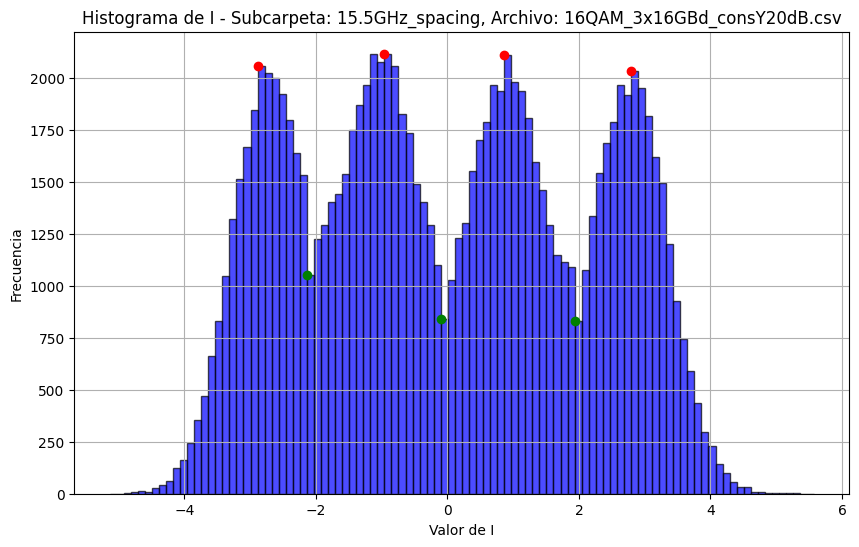

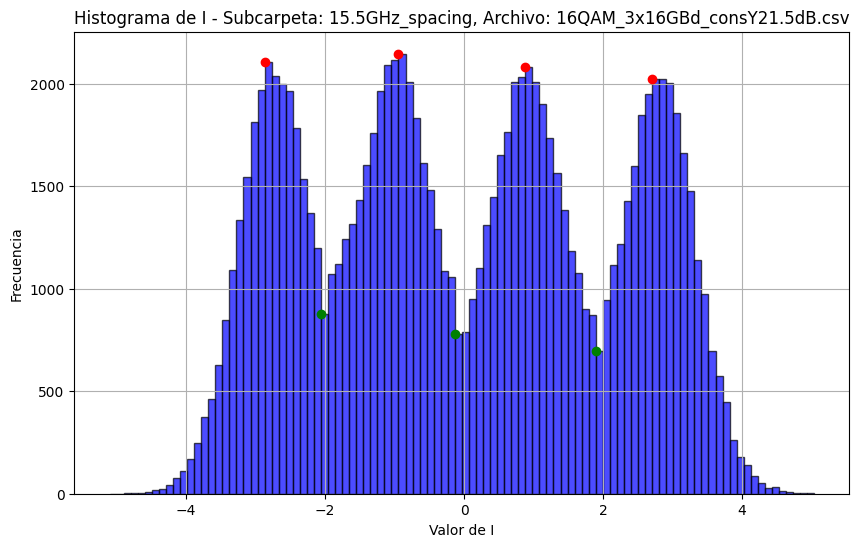

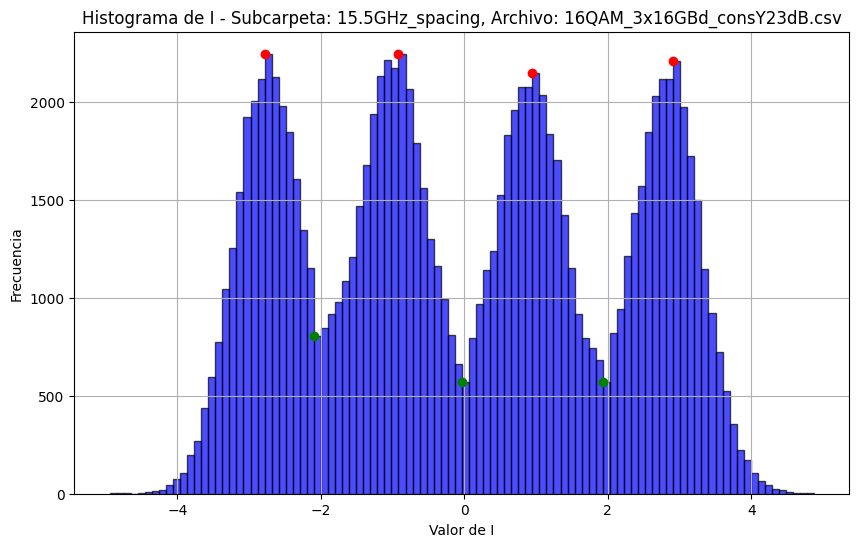

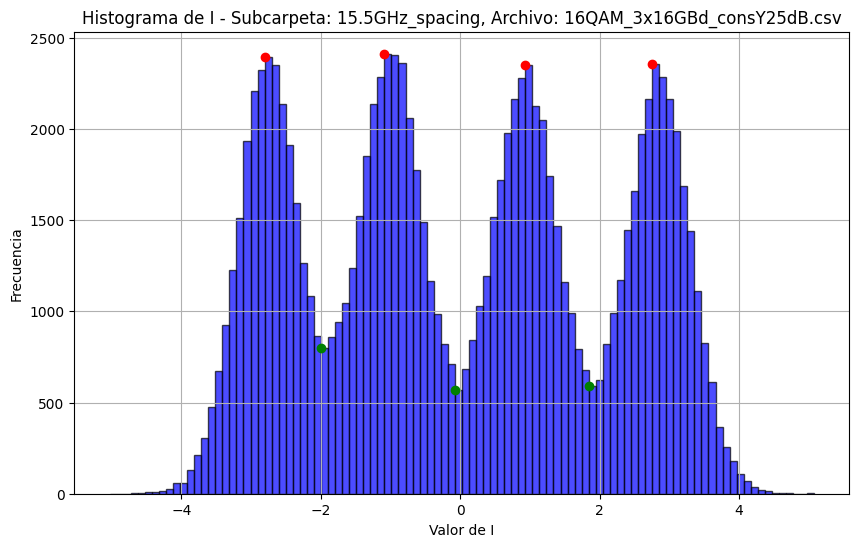

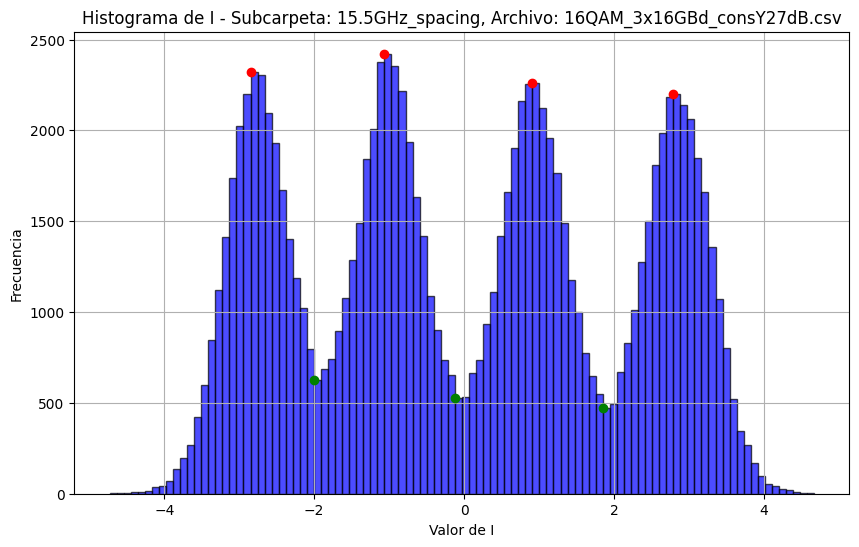

...

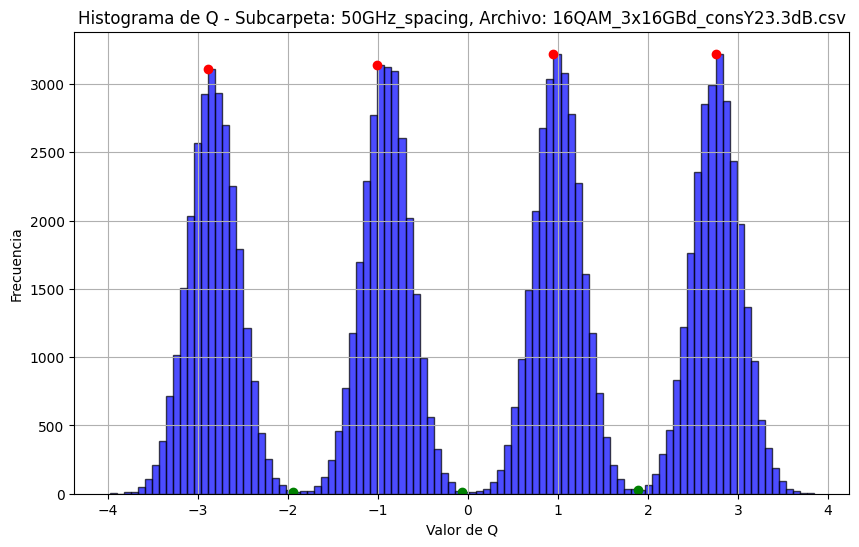

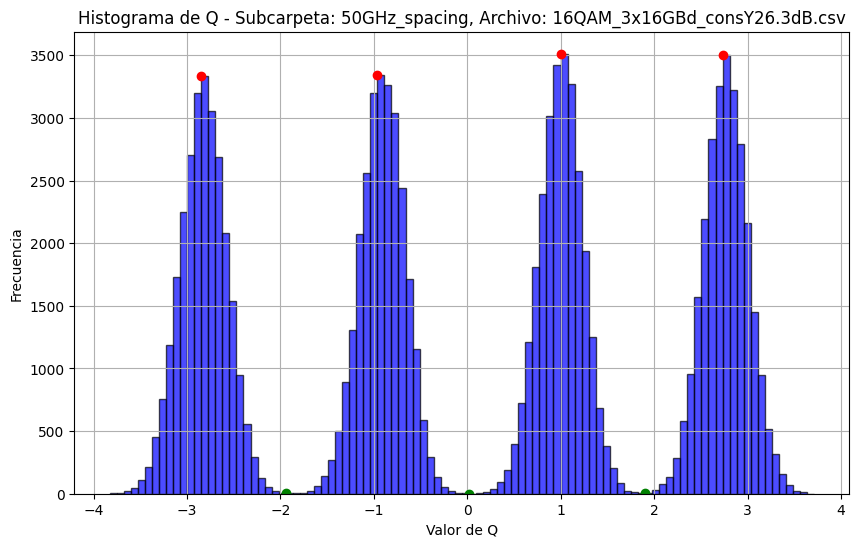

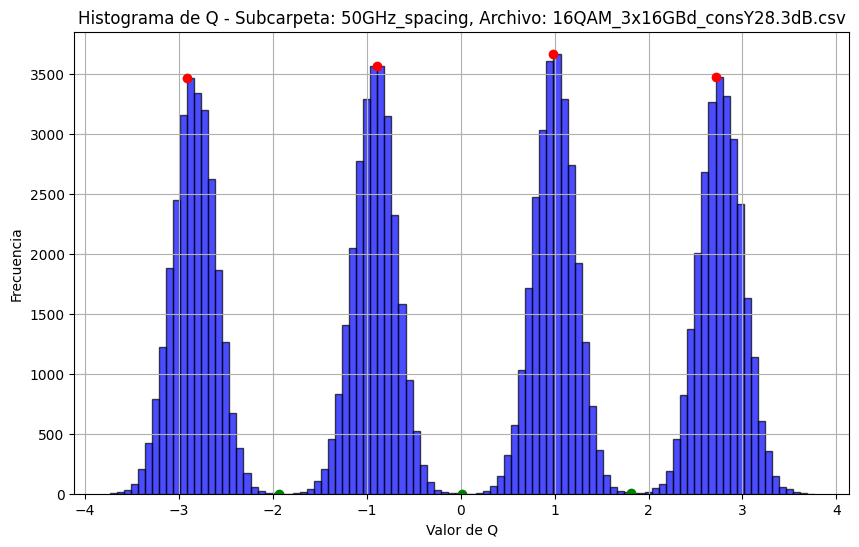

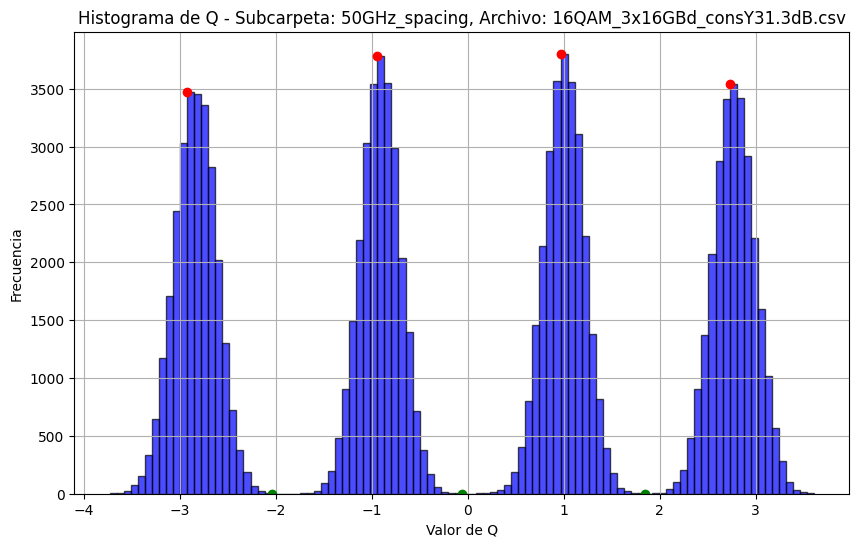

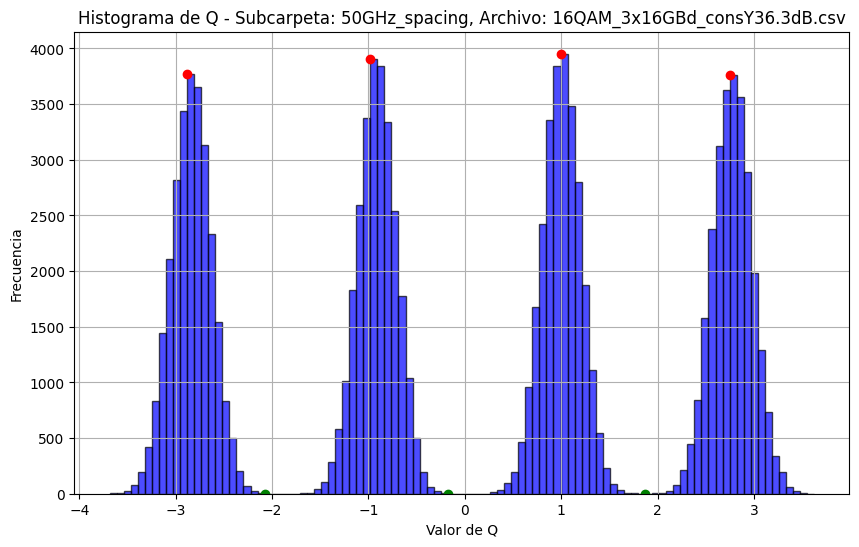

In [5]:
#DATOS CON EL SPACING
#uso de all:
# Lista las subcarpetas disponibles
list_subfolders(data)
pattern = r'(\d+(\.\d+)?)GHz'
pattern_osnr = r'(\d+(\.\d+)?)(?=dB)'
# Solicitar al usuario que ingrese la subcarpeta deseada
#selected_subfolder = input("Ingrese la carpeta que desea: ")
matriz_caract = np.empty(18)
for subfolder_name in data.keys():   
    if subfolder_name.endswith('spacing'):
        match = re.search(pattern, subfolder_name)
        
        if match:
            
            spacing = float(match.group(1))
        # Llamar a la función y capturar los resultados
        
        resultsI = plot_histograms_for_subfolder_all(data, subfolder_name, 'I')
        resultsQ = plot_histograms_for_subfolder_all(data, subfolder_name, 'Q')
        

        
        for resultI, resultQ in zip(resultsI.items(), resultsQ.items()):
            
            match = re.search(pattern_osnr, resultI[0])
            
            if match:
                OSNR = float(match.group(1))
            I = resultI[1]
            Q = resultQ[1]
            vector = np.hstack((I["peaks"], Q["peaks"],
                                I["valleys"], Q["valleys"],
                                I["ensanchamiento"], 
                                Q["ensanchamiento"],
                               [spacing, OSNR]))
            matriz_caract = np.vstack((matriz_caract , vector)) 
        
    else: 
        print("F")



In [6]:
print(matriz_caract)
print(matriz_caract.shape)

[[ 6.23042070e-307  4.67296746e-307  1.69121096e-306 ...  1.37961777e-306
   7.56599807e-307  9.34609789e-307]
 [-2.88571933e+000 -9.57510572e-001  8.63575477e-001 ...  1.05567706e+001
   1.55000000e+001  2.00000000e+001]
 [-2.87095303e+000 -9.44478582e-001  8.80602479e-001 ...  1.03730975e+001
   1.55000000e+001  2.15000000e+001]
 ...
 [-2.79449685e+000 -1.00582326e+000  8.57378397e-001 ...  7.49608153e+000
   5.00000000e+001  2.83000000e+001]
 [-2.86188998e+000 -1.04890392e+000  9.09121014e-001 ...  7.34105637e+000
   5.00000000e+001  3.13000000e+001]
 [-2.85485891e+000 -1.03358062e+000  8.60548808e-001 ...  7.30979875e+000
   5.00000000e+001  3.63000000e+001]]
(82, 18)


In [7]:
# Convertir la lista en una matriz de numpy
matriz_caract = np.array(matriz_caract)

# Verificar la forma de la matriz
print("Shape de la matriz:", matriz_caract.shape)  # Debería ser (71, 19)

# Convertir la matriz en un DataFrame de pandas
df = pd.DataFrame(matriz_caract)

# Guardar el DataFrame en un archivo CSV
df.to_csv('matriz_caract.csv', index=False, header=False)

Shape de la matriz: (82, 18)


In [8]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion Matrix', cmap=plt.cm.Blues):
    """
    Esta función imprime y plotea la matriz de confusión.
    La normalización se puede aplicar configurando `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Matriz de confusión normalizada")
    else:
        print('Matriz de confusión sin normalización')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('Etiqueta verdadera')
    plt.xlabel('Etiqueta predicha')
    plt.tight_layout()


# KNN

In [9]:


# 1. Convertir los valores de OSNR en etiquetas binarias usando un umbral
umbral3 = 23
y_binary3 = (matriz_caract[:, -1] > umbral3).astype(int)

# 2. Crear una matriz de características que excluya la columna de OSNR
matriz_caract_sin_OSNR = matriz_caract[:, :-1]  # Todas las columnas menos la última

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train3, X_test3, y_train_binary3, y_test_binary3 = train_test_split(matriz_caract_sin_OSNR,
                                                                      y_binary3,
                                                                      test_size=0.3, 
                                                                      random_state=42)

# 3. Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15]}

# 4. Crear el modelo KNN
knn = KNeighborsClassifier()

# 5. Configurar GridSearchCV
grid_search3 = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5,
                           scoring='accuracy')

# 6. Entrenar el modelo utilizando GridSearchCV
grid_search3.fit(X_train3, y_train_binary3)

# 7. Imprimir los mejores hiperparámetros encontrados
print("Best Hyperparameters:", grid_search3.best_params_)

# 8. Hacer predicciones utilizando el mejor modelo
best_knn3 = grid_search3.best_estimator_
y_pred_binary3 = best_knn3.predict(X_test3)

# 9. Evaluar el modelo utilizando métricas de clasificación
cm3 = confusion_matrix(y_test_binary3, y_pred_binary3)
accuracy3 = accuracy_score(y_test_binary3, y_pred_binary3)

print("Confusion Matrix:")
print(cm3)
print("Accuracy:", accuracy3)

Best Hyperparameters: {'n_neighbors': 3}
Confusion Matrix:
[[ 7  3]
 [ 0 15]]
Accuracy: 0.88


Matriz de confusión normalizada


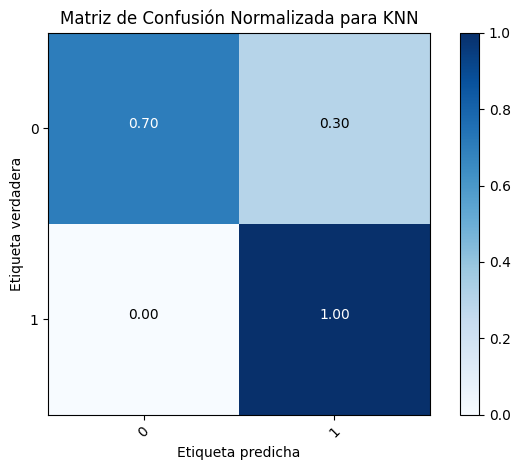

In [10]:
# Graficar la matriz de confusión
#class_names = np.unique(y_binary3)
# 9. Graficar la matriz de confusión
class_names = np.unique(y_test_binary3)
plot_confusion_matrix(cm3, classes=class_names, normalize=True, title='Matriz de Confusión Normalizada para KNN')

In [11]:
### Especificidad o precision
pre = precision_score(y_test_binary3, y_pred_binary3)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.8333


In [12]:
### Sensibilidad
sensi = recall_score(y_test_binary3, y_pred_binary3)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 1.0000


In [13]:
### F1-Score
puntaje = f1_score(y_test_binary3, y_pred_binary3)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.9091


# SVM

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.datasets import load_iris

In [15]:
# Cargamos un conjunto de datos de ejemplo (Iris)
#iris = load_iris()
#X = iris.data
#y = iris.target

# Definimos los hiperparámetros que queremos ajustar
parametros = {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf', 'poly'], 'gamma': [0.1, 1, 'auto']}

# Creamos un clasificador de Support Vector Machine (SVM)
svm = SVC()

# Creamos un objeto GridSearchCV para buscar los mejores hiperparámetros
grid_search = GridSearchCV(svm, parametros, cv=5)

# Ajustamos el modelo a los datos
grid_search.fit(X_train3, y_train_binary3)

# Mostramos los mejores hiperparámetros encontrados
print("Mejores hiperparámetros:", grid_search.best_params_)

# Mostramos la mejor puntuación de validación cruzada
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)

Mejores hiperparámetros: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Mejor puntuación de validación cruzada: 0.8939393939393939


In [16]:
model = SVC(C=10, kernel='rbf', gamma='auto')
model.fit(X_train3, y_train_binary3)

SVC(C=10, gamma='auto')

In [17]:
y_pred3 = model.predict(X_test3)
cm_svm = confusion_matrix(y_test_binary3, y_pred3,normalize='true')
print(cm_svm)

[[0.8        0.2       ]
 [0.06666667 0.93333333]]


Matriz de confusión normalizada


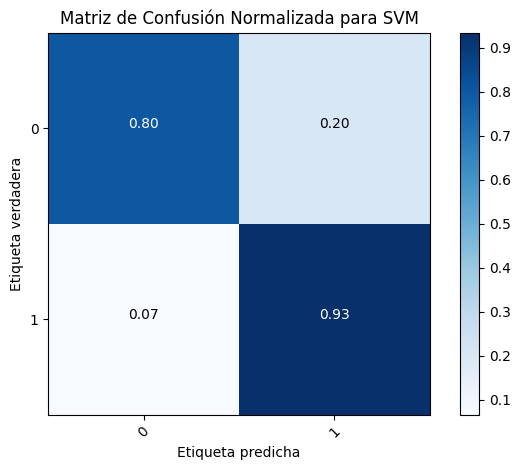

In [18]:
class_names = np.unique(y_train_binary3)
plot_confusion_matrix(cm_svm, classes=class_names, normalize=True, 
                      title='Matriz de Confusión Normalizada para SVM')

In [19]:
### Accuracy
exac = accuracy_score(y_test_binary3,y_pred3)
print(f'Exactitud del modelo: {exac:.4f}')

Exactitud del modelo: 0.8800


In [20]:
### Especificidad o precision
pre = precision_score(y_test_binary3,y_pred3)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.8750


In [21]:
### Sensibilidad
sensi = recall_score(y_test_binary3,y_pred3)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 0.9333


In [22]:
### F1-Score
puntaje = f1_score(y_test_binary3,y_pred3)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.9032


# Algoritmo Random-Forest

In [23]:
model = RandomForestClassifier()
model.fit(X_train3, y_train_binary3)

RandomForestClassifier()

In [24]:
y_pred3 = model.predict(X_test3)
cm_f = confusion_matrix(y_test_binary3, y_pred3,normalize='true')
print(cm_f)

[[0.8 0.2]
 [0.2 0.8]]


Matriz de confusión normalizada


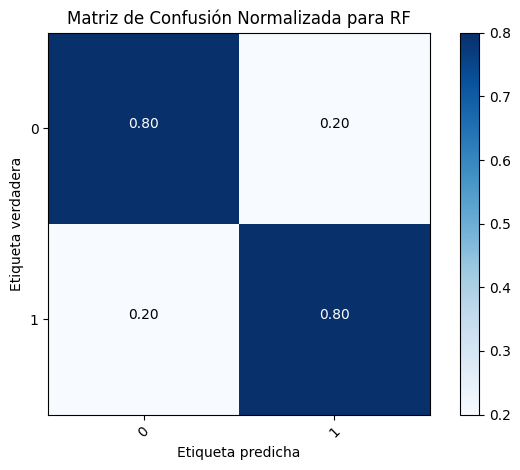

In [25]:
class_names = np.unique(y_train_binary3)
plot_confusion_matrix(cm_f, classes=class_names, normalize=True,
                      title='Matriz de Confusión Normalizada para RF')

In [26]:
### Accuracy
exac = accuracy_score(y_test_binary3,y_pred3)
print(f'Exactitud del modelo: {exac:.4f}')

Exactitud del modelo: 0.8000


In [27]:
### Especificidad o precision
pre = precision_score(y_test_binary3,y_pred3)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.8571


In [28]:
### Sensibilidad
sensi = recall_score(y_test_binary3,y_pred3)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 0.8000


In [29]:
### F1-Score
puntaje = f1_score(y_test_binary3,y_pred3)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.8276


# Datos sin spacing

Subcarpetas disponibles:
.ipynb_checkpoints
15.5GHz_spacing
15GHz_spacing
16.5GHz_spacing
16GHz_spacing
17.6GHz_spacing
17GHz_spacing
18GHz_spacing
50GHz_spacing
F


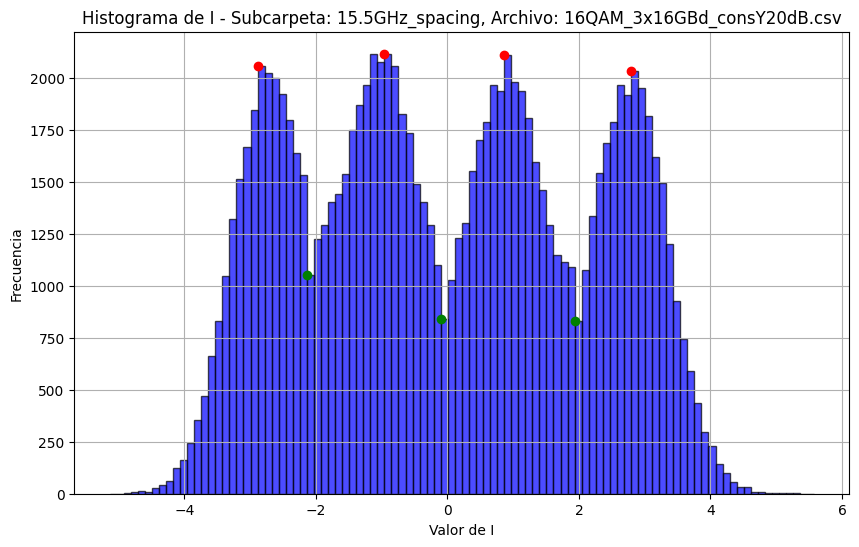

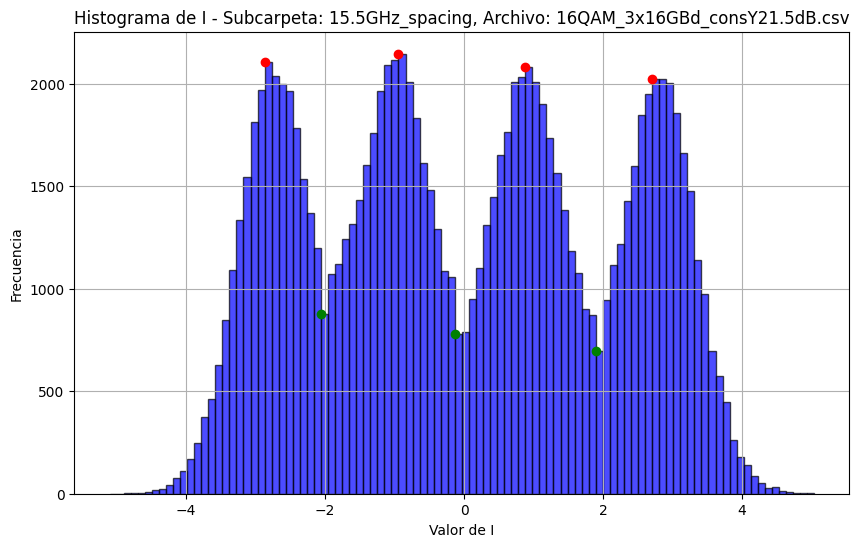

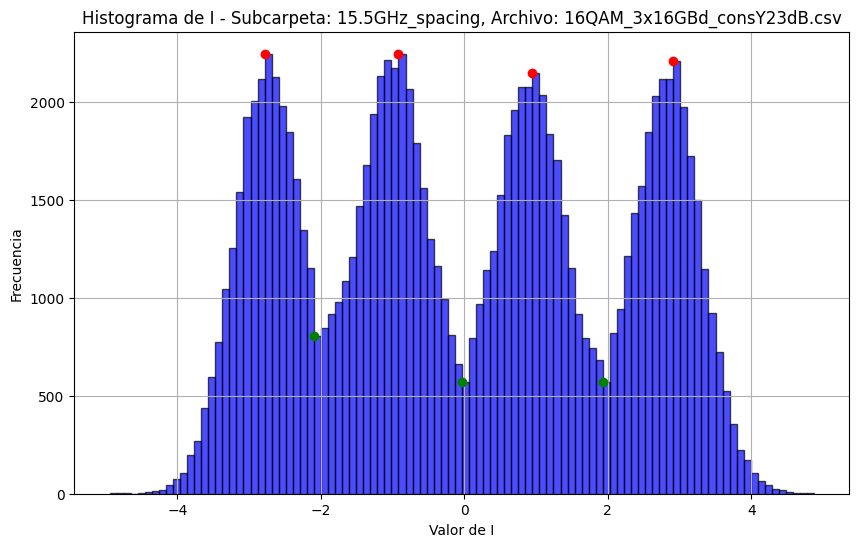

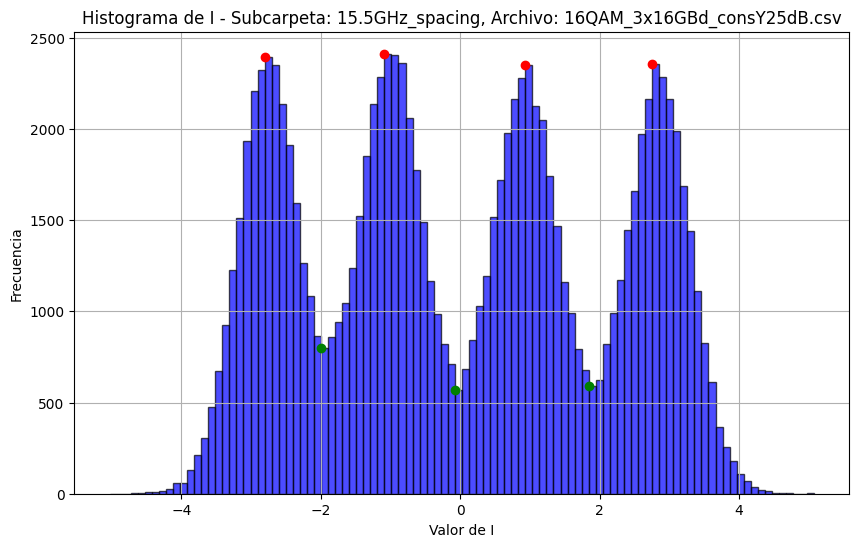

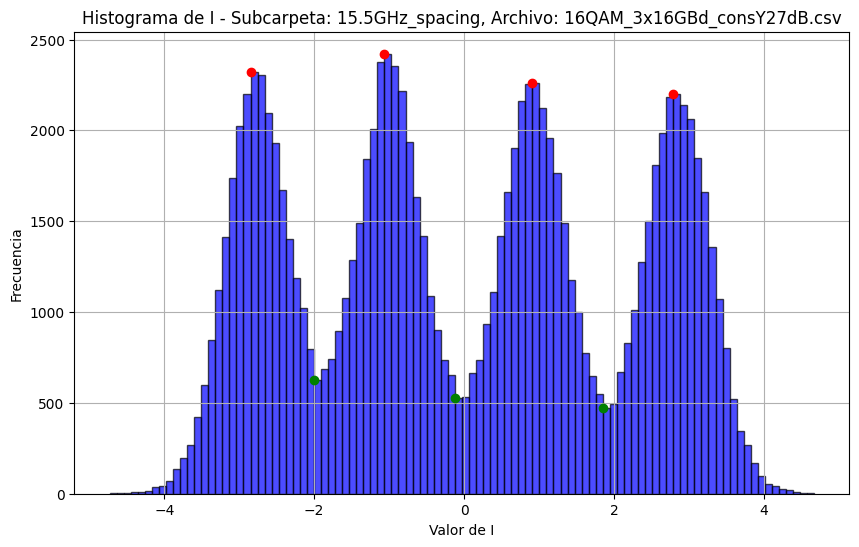

...

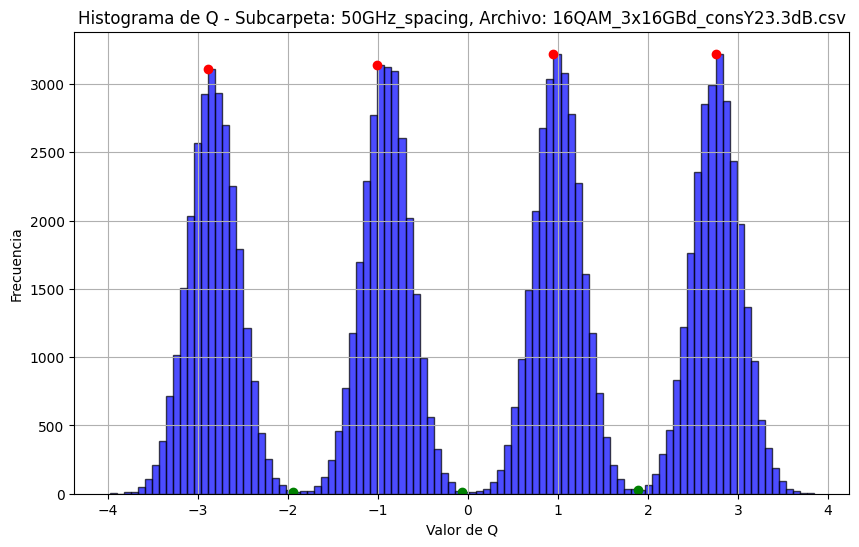

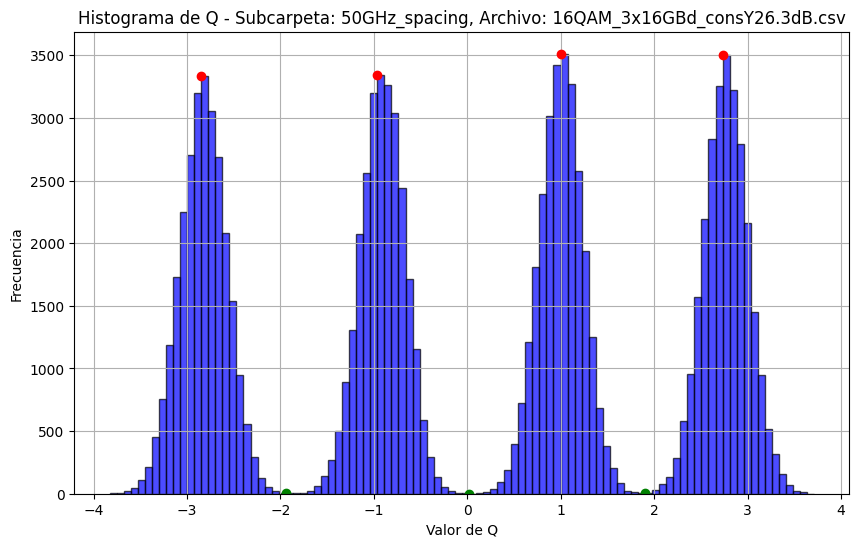

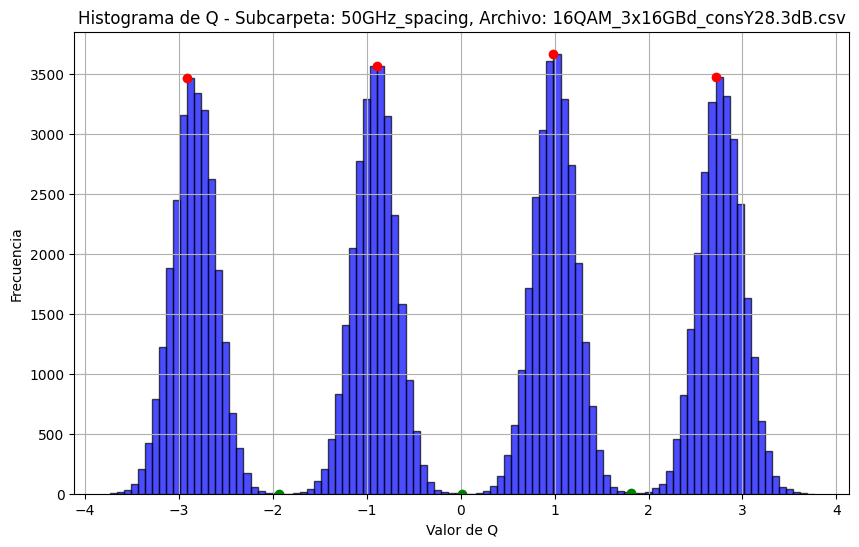

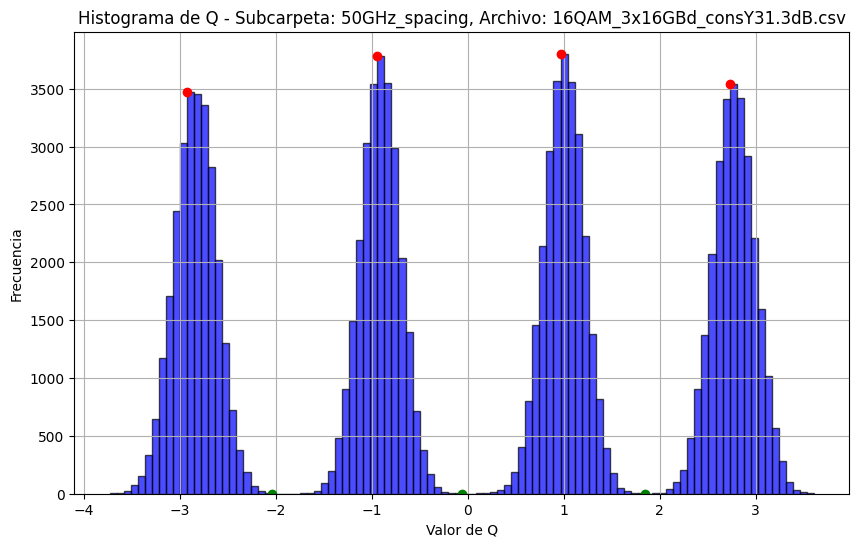

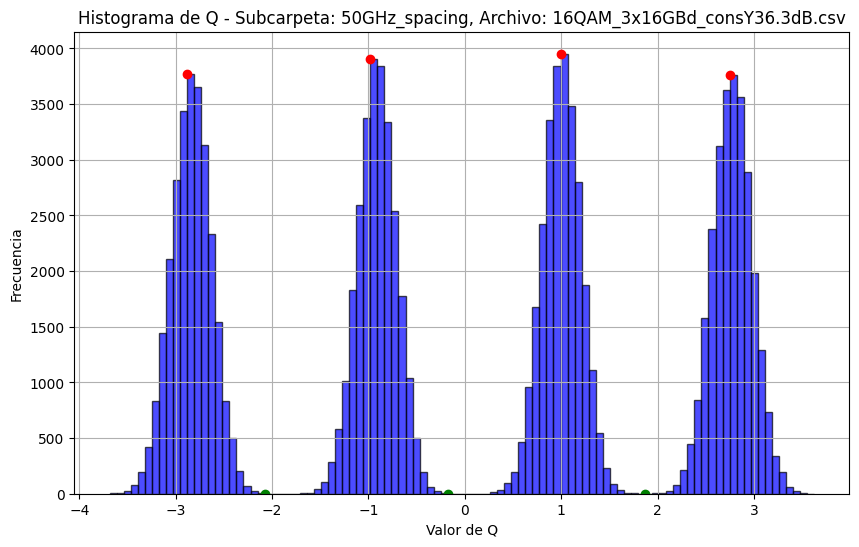

In [30]:
#DATOS SIN EL SPACING
#uso de all sin spacing:
# Lista las subcarpetas disponibles
list_subfolders(data)
pattern2 = r'(\d+(\.\d+)?)GHz'
pattern_osnr2 = r'(\d+(\.\d+)?)(?=dB)'
# Solicitar al usuario que ingrese la subcarpeta deseada
#selected_subfolder = input("Ingrese la carpeta que desea: ")
matriz_caract2 = np.empty(17)
for subfolder_name in data.keys():   
    if subfolder_name.endswith('spacing'):
        match2 = re.search(pattern2, subfolder_name)
        
        if match2:
            
            spacing = float(match2.group(1))
        # Llamar a la función y capturar los resultados
        
        resultsI2 = plot_histograms_for_subfolder_all(data, subfolder_name, 'I')
        resultsQ2 = plot_histograms_for_subfolder_all(data, subfolder_name, 'Q')
        

        
        for resultI2, resultQ2 in zip(resultsI2.items(), resultsQ2.items()):
            
            match2 = re.search(pattern_osnr2, resultI2[0])
            
            if match2:
                OSNR2 = float(match2.group(1))
            I2 = resultI2[1]
            Q2 = resultQ2[1]
            vector2 = np.hstack((I2["peaks"], Q2["peaks"],
                                I2["valleys"], Q2["valleys"],
                                I2["ensanchamiento"], 
                                Q2["ensanchamiento"],
                               [OSNR2]))
            matriz_caract2 = np.vstack((matriz_caract2 , vector2)) 
        
    else: 
        print("F")


# KNN

In [31]:
# 1. Convertir los valores de OSNR en etiquetas binarias usando un umbral
umbral2 = 23
y_binary2 = (matriz_caract2[:, -1] > umbral2).astype(int)

# 2. Crear una matriz de características que excluya la columna de OSNR
matriz_caract_sin_OSNR2 = matriz_caract2[:, :-1]  # Todas las columnas menos la última

# 2. Dividir los datos en conjuntos de entrenamiento y prueba
X_train2, X_test2, y_train_binary2, y_test_binary2 = train_test_split(matriz_caract_sin_OSNR2, y_binary2,
                                                                      test_size=0.3, 
                                                                      random_state=42)

# 3. Definir el espacio de búsqueda de hiperparámetros
param_grid = {
    'n_neighbors': [3, 5, 7, 9, 11, 13, 15]}

# 4. Crear el modelo KNN
knn = KNeighborsClassifier()

# 5. Configurar GridSearchCV
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5,
                           scoring='accuracy')

# 6. Entrenar el modelo utilizando GridSearchCV
grid_search.fit(X_train2, y_train_binary2)

# 7. Imprimir los mejores hiperparámetros encontrados
print("Best Hyperparameters:", grid_search.best_params_)

# 8. Hacer predicciones utilizando el mejor modelo
best_knn = grid_search.best_estimator_
y_pred_binary2 = best_knn.predict(X_test2)

# 9. Evaluar el modelo utilizando métricas de clasificación
cm2 = confusion_matrix(y_test_binary2, y_pred_binary2)
accuracy2 = accuracy_score(y_test_binary2, y_pred_binary2)

print("Confusion Matrix:")
print(cm2)
print("Accuracy:", accuracy2)

Best Hyperparameters: {'n_neighbors': 13}
Confusion Matrix:
[[8 2]
 [6 9]]
Accuracy: 0.68


Matriz de confusión normalizada


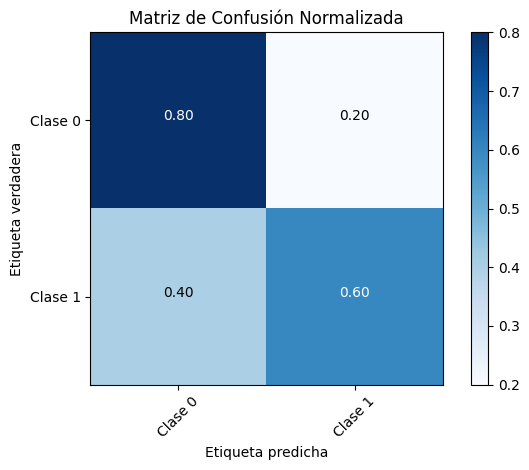

In [32]:
class_names = np.unique(y_test_binary2)
# Llamar a la función plot_confusion_matrix
plt.figure()
plot_confusion_matrix(cm2, classes=['Clase 0', 'Clase 1'], normalize=True,
                      title='Matriz de Confusión Normalizada')
plt.show()

In [33]:
### Especificidad o precision
pre = precision_score(y_test_binary2, y_pred_binary2)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.8182


In [34]:
### Sensibilidad
sensi = recall_score(y_test_binary2, y_pred_binary2)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 0.6000


In [35]:
### F1-Score
puntaje = f1_score(y_test_binary2,y_pred_binary2)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.6923


# SVM

In [36]:
# Cargamos un conjunto de datos de ejemplo (Iris)
#iris = load_iris()
#X = iris.data
#y = iris.target

# Definimos los hiperparámetros que queremos ajustar
parametros = {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf', 'poly'], 'gamma': [0.1, 1, 'auto']}

# Creamos un clasificador de Support Vector Machine (SVM)
svm = SVC()

# Creamos un objeto GridSearchCV para buscar los mejores hiperparámetros
grid_search = GridSearchCV(svm, parametros, cv=5)

# Ajustamos el modelo a los datos
grid_search.fit(X_train2, y_train_binary2)

# Mostramos los mejores hiperparámetros encontrados
print("Mejores hiperparámetros:", grid_search.best_params_)

# Mostramos la mejor puntuación de validación cruzada
print("Mejor puntuación de validación cruzada:", grid_search.best_score_)

Mejores hiperparámetros: {'C': 10, 'gamma': 1, 'kernel': 'rbf'}
Mejor puntuación de validación cruzada: 0.8424242424242424


In [37]:
model = SVC(C=10, kernel='rbf', gamma= 1)
model.fit(X_train2, y_train_binary2)

SVC(C=10, gamma=1)

In [38]:
y_pred2 = model.predict(X_test2)
cm_svm = confusion_matrix(y_test_binary2, y_pred2,normalize='true')
print(cm_svm)

[[0.7        0.3       ]
 [0.26666667 0.73333333]]


Matriz de confusión normalizada


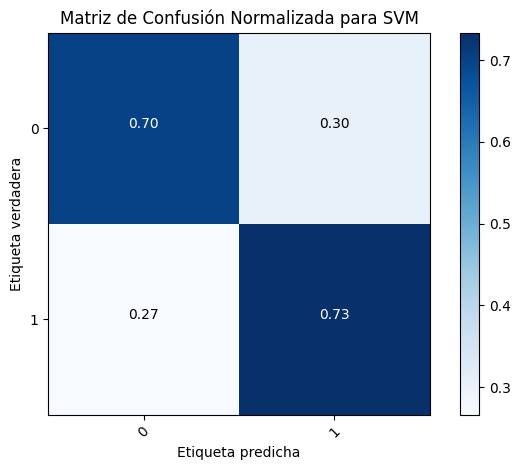

In [39]:
class_names = np.unique(y_train_binary2)
plot_confusion_matrix(cm_svm, classes=class_names, normalize=True, 
                      title='Matriz de Confusión Normalizada para SVM')

In [40]:
### Accuracy
exac = accuracy_score(y_test_binary2,y_pred2)
print(f'Exactitud del modelo: {exac:.4f}')

Exactitud del modelo: 0.7200


In [41]:
### Especificidad o precision
pre = precision_score(y_test_binary2,y_pred2)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.7857


In [42]:
### Sensibilidad
sensi = recall_score(y_test_binary2,y_pred2)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 0.7333


In [43]:
### F1-Score
puntaje = f1_score(y_test_binary3,y_pred3)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.8276


# radom forest

In [44]:
model = RandomForestClassifier()
model.fit(X_train2, y_train_binary2)

RandomForestClassifier()

In [45]:
y_pred2 = model.predict(X_test2)
cm_f = confusion_matrix(y_test_binary2, y_pred2,normalize='true')
print(cm_f)

[[0.7        0.3       ]
 [0.26666667 0.73333333]]


Matriz de confusión normalizada


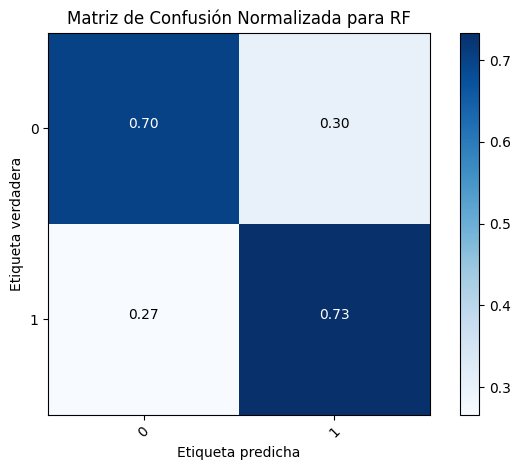

In [46]:
class_names = np.unique(y_train_binary2)
plot_confusion_matrix(cm_f, classes=class_names, normalize=True,
                      title='Matriz de Confusión Normalizada para RF')

In [47]:
### Accuracy
exac = accuracy_score(y_test_binary2,y_pred2)
print(f'Exactitud del modelo: {exac:.4f}')

Exactitud del modelo: 0.7200


In [48]:
### Especificidad o precision
pre = precision_score(y_test_binary2,y_pred2)
print(f'Presicion general del modelo: {pre:.4f}')

Presicion general del modelo: 0.7857


In [49]:
### Sensibilidad
sensi = recall_score(y_test_binary2,y_pred2)
print(f'Sensibilidad general del modelo: {sensi:.4f}')

Sensibilidad general del modelo: 0.7333


In [50]:
### F1-Score
puntaje = f1_score(y_test_binary2,y_pred2)
print(f'El puntaje general del modelo: {puntaje:.4f}')

El puntaje general del modelo: 0.7586
